# Condensator Ontwerpopdracht

Bij het vak elektromagnetisme zullen jullie in de eerste paar weken diep ingaan op de elektrostatica. Parallel hieraan zullen we bij het vak DEF-D, naast de fysieke ontwerpopdrachten en colleges, deze simulatie-ontwerpopdracht behandelen. Deze simulatie-opdracht is weer nauw verwoven met de tweede fysieke ontwerpopdracht die in week 3.3 gegeven wordt. Je moet het grootste deel van deze simulatie opdracht afronden voordat je aan de fysieke ontwerpopdracht van week 3.3 begint. Het laatste stuk van deze simulatie opdracht maak je na afloop van de fysieke opdracht. De deadline voor het inleveren van deze simulatie-opdracht is in week 3.4

Je werkt bij deze opdracht in teams die wij indelen. Zoek op Brightspace op met wie je samenwerkt en leg via email contact. Maak goede afspraken over hoe je samen gaat werken.

In deze simulatie opdracht beginnen we met een aantal simulaties van verschillende situaties, die jullie daarna zullen interpreteren. Daarna zal wat essentiële voorbereiding op de tweede fysieke ontwerpopdracht besproken worden. En als laatste zal dieper ingegaan worden op hoe jullie metingen van de tweede ontwerpopdracht afwijken van de theorie.

De opdracht bestaat uit de volgende sub-opdrachten die je moet doen voordat je begint aan de fysieke ontwerpopdracht van week 3.3:
1) Een puntlading in de oorsprong.
2) Een uniform geladen schijf bestaande uit puntladingen.
3) Een geladen schijf op een constant potentiaal.
4) Twee geleidende platen op potentiaal $V_1$ and $-V_1$.
5) Voorbereidende opdracht voor de DEF ontwerpopdracht.

Na de fysieke ontwerpopdracht van week 3.3 kan je ten slotte het laatste deel doen:

6) Reflectie opdracht voor na de fysieke ontwerpopdracht.

De opdracht wordt volledig online gedaan, er zullen hiervoor dus ook geen specifieke werkcolleges voor zijn ingeroosterd. Als jullie vragen hebben kunnen jullie die mailen naar het DEF e-mailadres: DEF-TNW@tudelft.nl. Deze opdracht wordt in week 3.4 beoordeeld en herkansingen zijn in week 3.5, zie de studiehandleiding voor details.
   
Technische Instructies:
- Git clone (als nog niet gedaan) het DEF repo en maak een branch voor werken aan deze opdracht. Nodig je groepsgenoot uit als collaborator. Hiervoor staat een manual op brightspace.
- Dit notebook maakt gebruik van een aantal functies die in het bestand ```functions_electrostatics.py``` staan. Dit bestand moet in dezelfde map (folder) staan als dit notebook. Als je git clone doet, gaat dat automatisch goed, maar verplaats dit notebook dus niet naar een andere map, mail het niet naar een mede-student, etc. Als je niet weet wat een map (folder) en een bestand is, bekijk dan [deze tutorial](https://teachbooks.io/files-and-folders/EN/intro.html).

Onderwijs Instructies:
- Beantwoord de vragen die in dit notebook voor komen direct in dit notebook.
- Als je iets moet printen op het scherm als antwoord op een vraag, doe dit op een gestructureerde manier met als dat relevant is de eenheid erbij, zoals je geleerd is bij het Inleidend Practicum.
- Vermijd 'hardcoden' waar mogelijk.
- Bij elke code cel staat aangegeven of jij hem moet aanpassen of alleen runnen. Lees bij cellen die je moet runnen, maar niet hoeft aan te passen, goed de code door om daarvan te leren en te gebruiken in de cellen die je wel moet aanpassen.

Elektrostatica Opmerkingen:
- In deze opdracht zullen jullie verschillende problemen bestuderen die as-symmetrie hebben. De opdrachten zullen daardoor, cilindrische coördinaten ($r$,$\phi$,$z$) gebruiken, waarbij $r$ de afstand tot de $z$ as is, $z$ de hoogte en $\phi$ de hoek met de $x$-as. Alle gebruikte problemen zullen ook in de $\phi$ richting symmetrisch zijn en die coördinaat zal dus niet uitmaken.
- Voor elke sub-opdracht zal eerst het potentiaal bepaald worden en daarna zal het elektrische veld bepaald worden met de "finite difference" methode. Dit is een methode om de afgeleide te nemen van een dataset. Deze methode is geen onderdeel van de leerdoelen van het vak en komt later in je studie aan bod. We gebruiken "finite difference" hier als gereedschap en als voorbeeld van wat je later nog tegen gaat komen.



Vul de informatie in deze cel in:

| Groep: 15     |  |
| :-------------|:-------------|
| Shahraan Rahimbaksh | 6500803|
| Lukas Calixtro | 6528619 |

In [1]:
# Run deze cel, pas deze niet aan
import numpy as np
import matplotlib.pyplot as plt
from functions_electrostatics import *
#from IPython import display
from IPython.display import Image, display


epsilon0 = 8.854e-12  # permittiviteit van vacuum (F/m)

"""============================================================================================
We first define the size of the domain of calculation and spatial discretization of the domain
"""

# Grid van het rekendomein; het veld wordt berekend in het (r,z)-vlak (asymmetrie):
width_domain = 5  # (m)
height_domain = width_domain  # maximum afstand van de schijf tot de grond, boven en beneden (m)
grid_step = 0.1  # grid stap grootte (m)

### 1) Een puntlading in de oorsprong

In deze opdracht gaan we in op een numerieke benadering van het potentiaal en elektrische veld rond een puntlading in de oorsprong. 

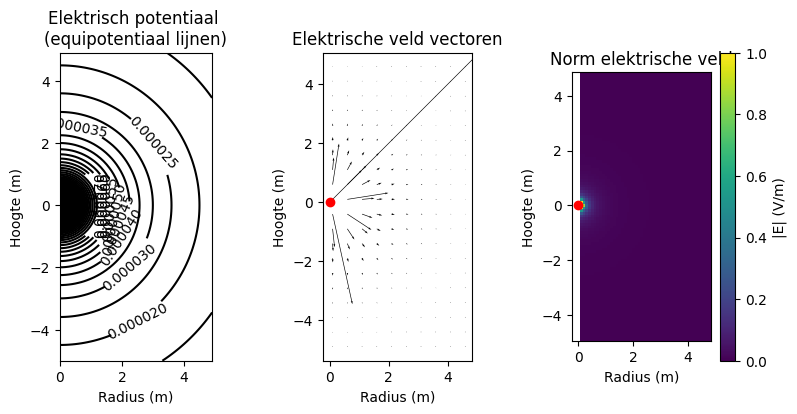

In [2]:
# Run deze cel, pas de cel niet aan
charge_one_point = 1e-14  # lading van 1 punt (C)

r, z, B = initialize_plane_grid_for_pt_charge_at_origin(height_domain, width_domain, grid_step)
V = calculate_V_point_charge_at_origin(charge_one_point, r, z)

Er, Ez, normE = compute_E_pt_charge(V, B, grid_step)  # gebruik de centered finite-difference method
# met Er de r-component, Ez de z-component en normE de norm van het elektrische veld

r_for_E = r[1:-1]  # de centered finite-difference method kan E niet berekenen op het allereerste en allerlaatste gridpunt in de r-dimensie
z_for_E = z[1:-1]  # de centered finite-difference method kan E niet berekenen op het allereerste en allerlaatste gridpunt in de z-dimensie

plot_results_pt_charge_at_origin(Ez, Er, normE, V, r, z, grid_step)


##### Vraag 1a Het potentiaal rond een puntlading

1. Bepaal welke index correspondeert met $z = 0$ m.
2. Plot de log van het potentiaal tegen de log van de straal.
3. Fit de log van het potentiaal met de log van de straal.
4. Print het exponent op een nette manier.

50


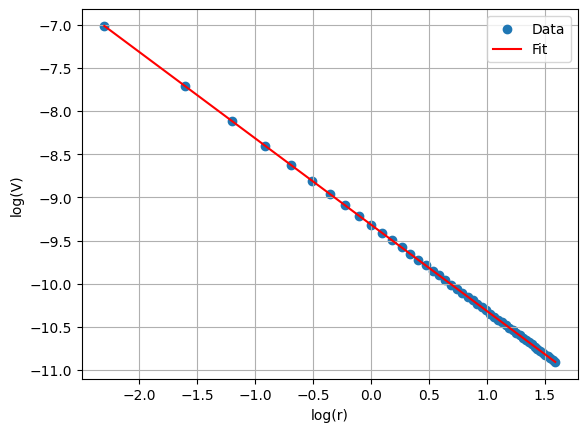

De helling a van de fit is: -1.0


In [3]:
###
###Hier jouw code###
###

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit   

index_z0 = np.argmin(np.abs(z)) #zoeken waarde van z die het dichtst bij 0 ligt, oftewel de index van z=0 in de array z
print(index_z0)  

V_z0= V[index_z0, :] #potentiaal op z=0 --> het is V(r, z=0) . Door dit te nemen selecteren we alle r-waarden bij z=0

# r kan niet gelijk zijn aan 0 omdat we daar een singulariteit hebben, dus we moeten de eerste waarde van r overslaan   

r_geenzero= r[1:]
V_z0_geenzero= V_z0[1:] 

#Het potentiaal is omgekeerd evenredig met de afstand tot de lading, dus we kunnen een lineaire fit maken van V_z0_geenzero tegen 1/r_geenzero met logaritmische schalen om de constante van de lading te vinden
log_r= np.log(r_geenzero)
log_V= np.log(np.abs(V_z0_geenzero)) 

#We kunnen nu een lineaire fit maken van log_V tegen log_r: log(V)= a * log(r) + b, waarbij a de helling is en b de intercept. 
#Lineaire fit maken
def lineair(x, a, b):
    return a * x + b

popt, pcov = curve_fit(lineair, log_r, log_V)
a_fit = popt[0]
b_fit = popt[1]


#Plot de resultaten
plt.figure() 
plt.scatter(log_r, log_V, label='Data')
plt.plot(log_r, lineair(log_r, a_fit, b_fit), label='Fit', color='red')
plt.xlabel('log(r)')
plt.ylabel('log(V)')
plt.legend()
plt.grid(True)
plt.show()
 

print(f"De helling a van de fit is: {a_fit}")




##### Vraag 1b Het elektrische veld rond een puntlading
1. Voer van vraag 1a 2 tot 4 uit voor het elektrische veld.

49


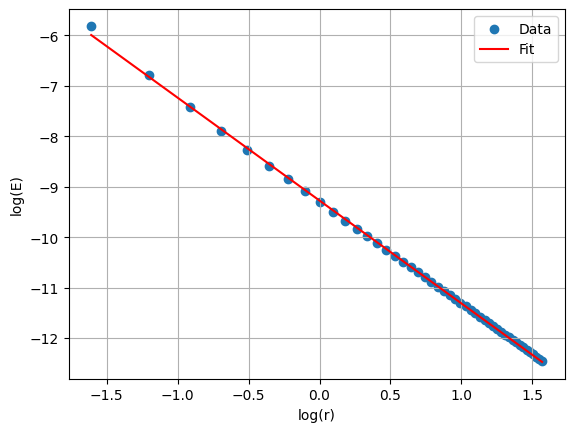

De helling a van de fit is: -2.0403594570526855


In [4]:
###
###Hier jouw code###
###
index_z0_E= np.argmin(np.abs(z_for_E)) #zoeken waarde van z die het dichtst bij 0 ligt, oftewel de index van z=0 in de array z_for_E
print(index_z0_E)

E_z0= normE[index_z0_E, :] #norm van het elektrische veld op z=0 --> het is normE(r, z=0) . Door dit te nemen selecteren we alle r-waarden bij z=0

# r kan niet gelijk zijn aan 0 omdat we daar een singulariteit hebben, dus we moeten de eerste waarde van r overslaan
r_geenzero_E= r_for_E[1:]
E_z0_geenzero= E_z0[1:]

#Elektrisch veld is kwadratisch omgekeerd evenredig met de afstand tot de lading, dus we kunnen een lineaire fit maken.

log_r_E= np.log(r_geenzero_E)
log_E= np.log(np.abs(E_z0_geenzero))

def lineair_E(x, a, b):
    return a * x + b

popt_E, pcov_E = curve_fit(lineair_E, log_r_E, log_E)

a_fit_E = popt_E[0]
b_fit_E = popt_E[1]


#Plot de resultaten
plt.figure()
plt.scatter(log_r_E, log_E, label='Data')
plt.plot(log_r_E, lineair_E(log_r_E, a_fit_E, b_fit_E), label='Fit', color='red')
plt.xlabel('log(r)')
plt.ylabel('log(E)')
plt.legend()
plt.grid(True)
plt.show()

print(f"De helling a van de fit is: {a_fit_E}")




### 2) Een uniform geladen schijf bestaande uit puntladingen

In de code hieronder wordt een geladen schijf gemaakt via het superpositie principe. Dit wordt gedaan door een rooster van punten in de ruimte te creëren, alle punten die voldoen aan $z = 0$ m en $r < R$ krijgen een lading charge_one_point en vanuit hier wordt het potentiaal bepaald. Hier is de $z$-as de as van de schijf en de r as de afstand tot de $z$-as.



In [5]:
# In vraag 2.1 wordt naar deze cel verwezen.
disk_radius = 3 # (m)
grid_step = 0.1  # (m)
z_coord_DISK = 0  # (m) positie van de schijf op de z-as
inter_charge_distance = grid_step  # (m) afstand tussen punt ladingen

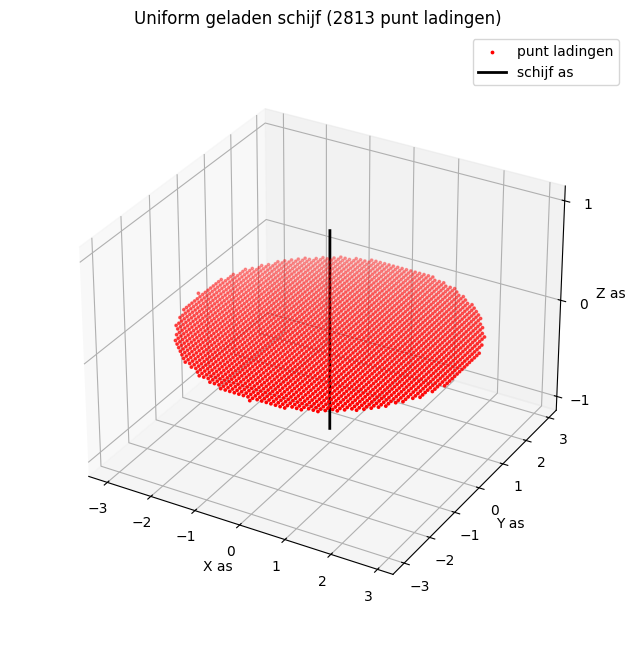

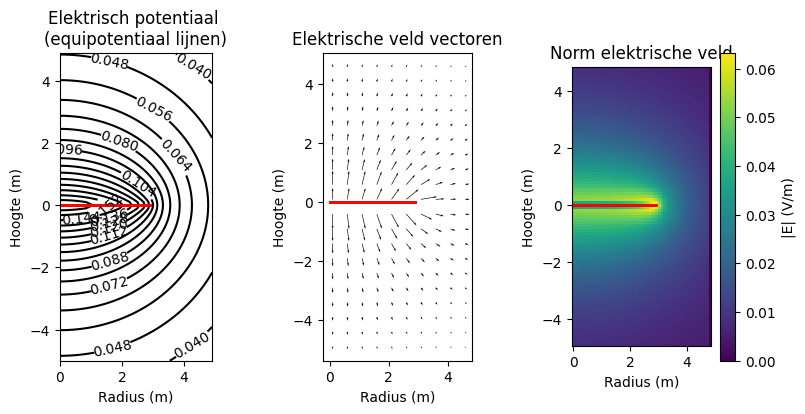

In [6]:
# Kies uit deze cel een van de variabelen en verander die in de cel hierboven pas deze cel zelf niet aan.
r, z, B = initialize_plane_grid_for_uniformly_charged_disk(height_domain, width_domain, grid_step)

idx_z_zero = np.where(abs(z) < 1e-10)[0]
z_coord_DISK = 0  # (m) positie van de schijf op de z-as
inter_charge_distance = grid_step  # (m) afstand tussen punt ladingen

V, number_point_charges_on_disk = calculate_V_disk_at_origin_uniform_surface_charge_density(z_coord_DISK, charge_one_point, disk_radius, inter_charge_distance, r, z)
Er, Ez, normE = compute_E_disk(V, B, grid_step)  # gebruik de centered finite-difference method

r_for_E = r[1:-1]  # de centered finite-difference method kan E niet berekenen op het allereerste en allerlaatste gridpunt in de r-dimensie
z_for_E = z[1:-1]  # de centered finite-difference method kan E niet berekenen op het allereerste en allerlaatste gridpunt in de z-dimensie

plot_results_disk(Ez, Er, normE, V, r, z, grid_step, disk_radius, z_coord_DISK, z_coord_DISK)

#### Vraag 2a

In deze vraag gaan jullie achterhalen wat de variabelen die aan het begin van opgave 2 worden geïnitialiseerd betekenen voor de nauwkeurigheid en snelheid van de code.
Pas voor deze vraag de code die net onder het kopje vraag 2 staat aan. Run dan die cel en de cel daaronder opnieuw om het resultaat van je aanpassing te zien.
1. Wat betekent de disk radius variabele die in de bovenste cel geïnitialiseerd wordt, wat gebeurt er als disk radius naar 0 gaat?
2. Wat betekent gridstep en wat voor impact heeft deze variabele op de simulatie?
3. Pak uit de tweede code cel in opdracht 2 een andere variabelen en onderzoek wat deze variabele doet en wat voor impact die heeft op de simulatie.

##### Antwoorden 2a

*Edit deze markdown cel met je antwoorden op vraag 2a.*

1. De disk radius variabele betekent de straal van de geladen schijft. Alle punten binnen deze straal krijgen een puntlading.
Als de disk radius --> 0 dan wordt de schijf een puntlading in de oorsprong 

2. Als het ware hoe fijner het rooster is waarop je de schijf verdeelt. Ofwel kleine grid_step heeft veel puntjes en is zo nauwkeuriger, maar duurt voor berekenen. Grotere grid_step is dus het tegenovergestelde.

3. Inter_charge_distance is de afstand tussen puntladingen op de schijf. Als deze klein is, zijn er meer puntladingen. De impact die het heeft op de simulatie is dat als het een kleinere afstand heeft er inderdaad meer puntladingen heeft, waardoor de schijft gladt lijkt en dus nauwkeuriger benaderd kan worden. alleen dit rekenwerkt duurt lang. Het tegenovergestelde is ook zo als de waarde groot is.


#### Vraag 2b Oppervlakte lading

Pas de cel die je in vraag 2a hebt aangepast weer aan naar de originele waardes. Run hierna alle code cellen na vraag 2 weer opnieuw.
Het aantal punten dat gebruikt wordt om de schijf te creëren is number_point_charges_on_disk en de lading van een punt is charge_one_point in Coulomb.
1. Bereken en print de ladingsdichtheid $\sigma$ met een correcte eenheid.

In [7]:
###
###Hier jouw code###
###

Q_tot= number_point_charges_on_disk * charge_one_point # totale lading op de schijf, waarbij number_point_charges_on_disk het aantal puntladingen op de schijf is en charge_one_point de lading van 1 punt is.
A_disk= np.pi * disk_radius**2 # oppervlakte van de schijf, waarbij disk_radius de straal van de schijf is.


sigma= Q_tot / A_disk # oppervlakte ladingsdichtheid (C/m^2) van de schijf, waarbij A_disk de oppervlakte van de schijf is en Q_tot de totale lading op de schijf is.


print(f"De oppervlakte ladingsdichtheid van de schijf is: {sigma} C/m^2")


De oppervlakte ladingsdichtheid van de schijf is: 9.948952331500036e-13 C/m^2


##### Vraag 2c

1. Plot het elektrische potentiaal langs de $r$ as ($z = 0$ m).
2. Plot het potentiaal op de rand van de schijf in hetzelfde figuur $V = \sigma R/(\pi \epsilon_0)$
(bekijk probleem 2.51 in het Griffiths' boek)
3. Plot het potentiaal in het centrum van de schijf in hetzelfde figuur $V = \sigma R/(2 \epsilon_0)$

V_z02c.shape = (50,)


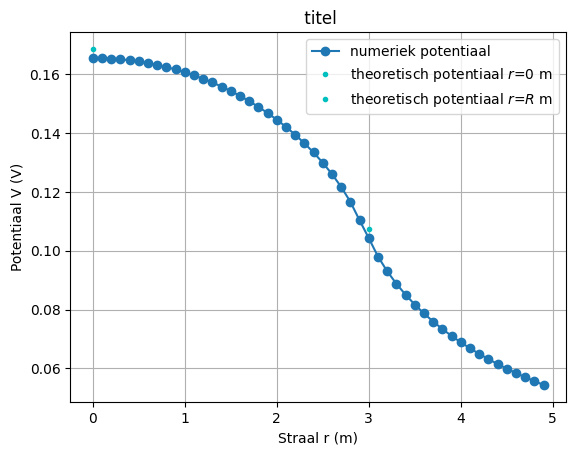

In [8]:
# Vul deze code aan zodat deze vraag 2.3 beantwoord.
idx_z_zero = np.argmin(np.abs(z)) #zoeken waarde van z die het dichtst bij 0 ligt, oftewel de index van z=0 in de array z


V_z02c= V[idx_z_zero, :] #potentiaal op z=0 --> het is V(r, z=0) . Door dit te nemen selecteren we alle r-waarden bij z=0

print("V_z02c.shape =", V_z02c.shape)

V_0 = sigma * disk_radius / (2 * epsilon0) # potentiaal op r = 0, waarbij sigma de oppervlakte ladingsdichtheid van de schijf is, disk_radius de straal van de schijf is en epsilon0 de permittiviteit van vacuum is.
    
V_R =  sigma* disk_radius / ( np.pi * epsilon0) # potentiaal op de straal van de schijf
r_R = disk_radius # straal van de schijf

plt.title(f" titel")
plt.plot(r, V_z02c, "o-", label="numeriek potentiaal")
plt.plot(0, V_0, "c.", label="theoretisch potentiaal $r$=0 m")
plt.plot(r_R, V_R, "c.", label="theoretisch potentiaal $r$=$R$ m")
plt.legend()
plt.xlabel("Straal r (m)")
plt.ylabel("Potentiaal V (V)")
plt.grid(True)
plt.show()



#### Vraag 2d

Het theoretische potentiaal op de as van een hele grote schijf ($R>>z$) is:
$V(z, r=0) = \frac{\sigma}{2\epsilon_0} \big( R - |z|\big)$
zie probleem 2.26 in het Griffiths boek.
1. Plot het numeriek berekend elektrische potentiaal op de $z$-as ($r=0$).
2. Plot het theoretische component van het potentiaal op de as van een schijf met ladingsdichtheid $\sigma$.
3. Sla deze plot op.


Shape van V_z02d: (100,)


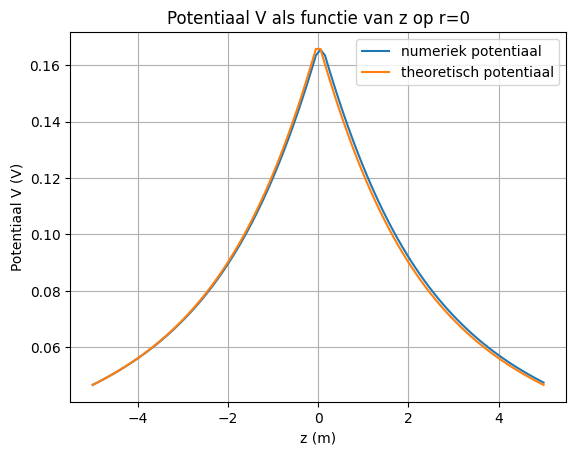

In [9]:
###
###Hier jouw code###
###

from numpy import sqrt


index_r_zero2d= np.argmin(np.abs(r)) #zoeken waarde van r die het dichtst bij 0 ligt, oftewel de index van r=0 in de array r

V_z02d= V[: , index_r_zero2d] #potentiaal op r=0 --> het is V(r=0, z) . Door dit te nemen selecteren we alle z-waarden bij r=0
print(f"Shape van V_z02d: {V_z02d.shape}")

z_values = np.linspace(-height_domain, height_domain, len(V_z02d))  # lengte  V_z02d


V_theorie= (sigma / (2 *epsilon0)) * (sqrt(disk_radius**2 + z_values**2) - np.abs(z_values)) 

plt.figure()
plt.plot(z_values, V_z02d, label="numeriek potentiaal")
plt.plot(z_values, V_theorie, label="theoretisch potentiaal")
plt.xlabel("z (m)")
plt.ylabel("Potentiaal V (V)")
plt.title("Potentiaal V als functie van z op r=0")
plt.legend()
plt.grid(True)
plt.show()
    







#### Vraag 2e

Het theoretische elektrische veld van een oneindig geladen oppervlakte is $|E| = \sigma/(2 \epsilon_0)$ (zie Example 2.5 in het Griffith boek).
1. Plot het z-component van het numeriek berekende elektrische veld op de as van de schijf ($r=0$).
2. Plot het theoretische elektrische veld voor een oneindig geladen oppervlak.
3. Sla deze plot ook op.

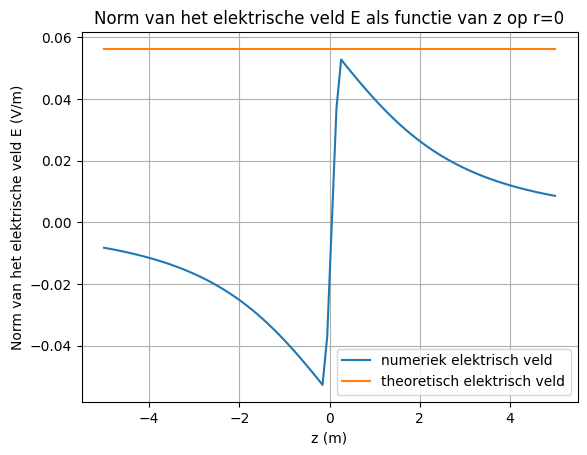

In [10]:
###
###Hier jouw code###
###

import numpy as np
import matplotlib.pyplot as plt

#index_r_zero2e = np.argmin(np.abs(r))  # index van r = 0

index_r_zero2e= np.argmin(np.abs(r_for_E))

E_r02e= Ez[:, index_r_zero2e] #norm van het elektrische veld op r=0 --> het is normE(r=0, z) . Door dit te nemen selecteren we alle z-waarden bij r=0

z_values_E = np.linspace(-height_domain, height_domain, len(E_r02e))  # z-waarden voor het elektrische veld, dezelfde lengte als E_r02e

E_theorie= (sigma / (2 * epsilon0)) * np.ones_like(z_values_E)

plt.figure()
plt.plot(z_values_E, E_r02e, label="numeriek elektrisch veld")
plt.plot(z_values_E, E_theorie, label="theoretisch elektrisch veld")
plt.xlabel("z (m)")
plt.ylabel("Norm van het elektrische veld E (V/m)")
plt.title("Norm van het elektrische veld E als functie van z op r=0")
plt.legend()
plt.grid(True)
plt.show()





#### Vraag 2f
1. Waar benadert het elektrische veld van een uniform geladen schijf dat van een oneindig geladen plaat?
2. Beschrijf en verklaar de verschillen die je opvallen in de plot die je bij vraag 2e hebt gemaakt.

##### Antwoorden 2f

1. Het wordt benadert wanneer je dicht bij het midden van de schijf bent en de afstand tot de schijf veel kleiner is dan de straal van de schijf. In dit gebied wordt het veld constant zoals in een oneindig vlak

2. 1: Numerieke veld is niet constant. Het is een beetje schuin, vanwege de rand-effecten van de eindige schijf
   2: Zodra z << r dan gaat het E naar de theoretische waarde, maar voor z >> r dan gaat E naar 0.


#### Vraag 2g

1. Pas helemaal bovenaan in vraag 2 de straal van de schijf aan.
2. Voer dan vragen 2d en 2e opnieuw uit.
3. Voeg de opgeslagen figuren hieronder toe.
4. Beschrijf de verschillen tussen de twee verschillende stralen.

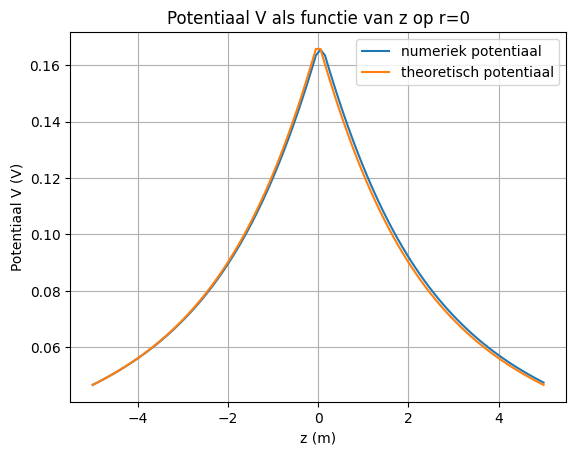

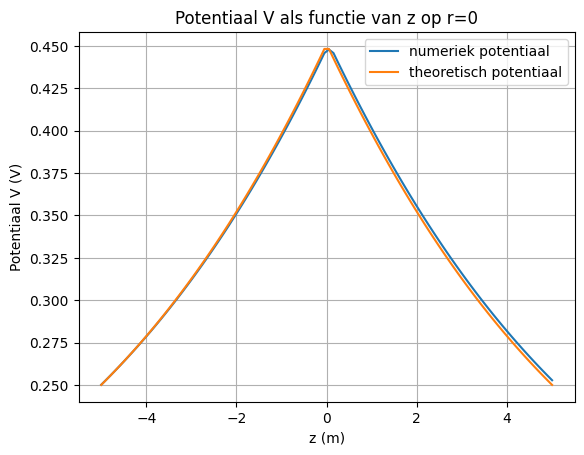

In [11]:
###
###Jouw code hier###
###
display(Image("Opdracht 2dr0.png"))
display(Image("Opdracht 2dr8.png"))


#display(Image("Opdracht 2er0.png"))
#display(Image("Opdracht 2er8.png"))



##### Antwoorden 2g

Voor r -> oneindig, dan neemt V(z) toe omdat er meer puntladingen in de volume zit en dus ook meet potentiaal energie. Omdat meer puntladingen aanwezig zijn, dan is de dichtbijste puntlading bij r=0 ook dichterbij dat punt. Hierdoor komt de numerieke waarde dichterbij de theoretische waarde van E(z) bij r = 0.

#### Vraag 2h
Het elektrische veld een afstand $z$ boven het midden van een uniform geladen schijf met een straal $R$ en oppervlakte lading $\sigma$ wordt gegeven door:
$$ \mathbf{E} = \frac{\sigma}{2\epsilon_0} \bigg[ 1- \frac{z}{\sqrt{R^2 + z^2}}\bigg] \hat{\mathbf{z}}$$
Zie probleem 2.6 in het boek van Griffith.

1. Wat moet de hoogte $z$ zijn boven de schijf zodat het elektrische veld door de schijf 10% is in vergelijking met dat van een oneindig geladen plaat?

Voeg hieronder je analytische uitwerking toe.

##### Antwoord 2h





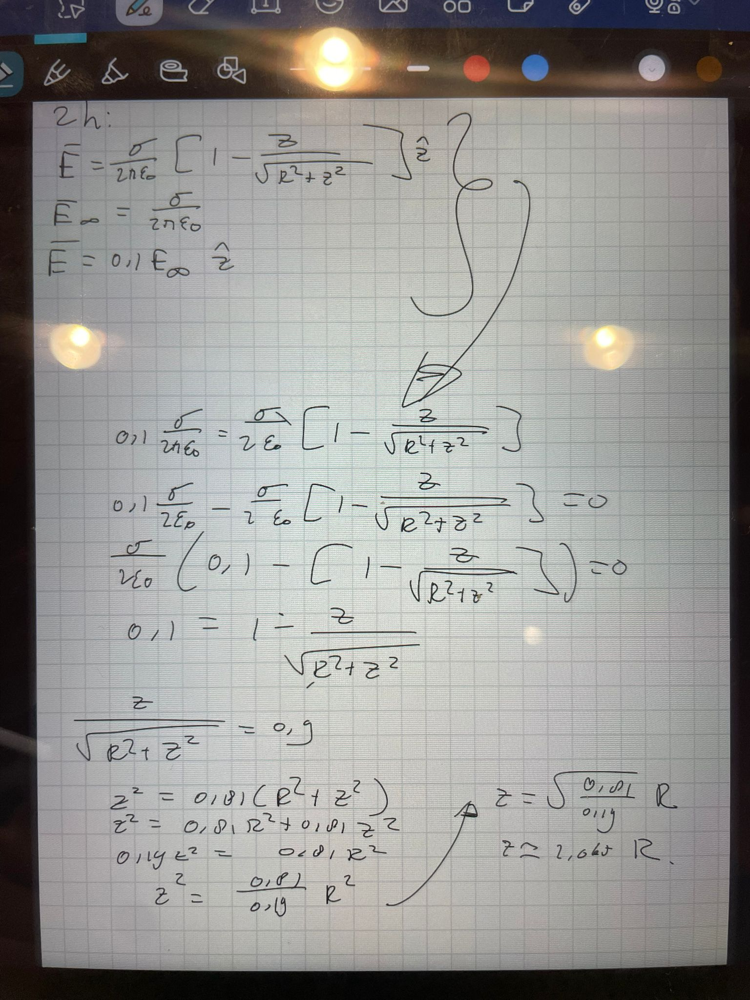

In [12]:
from IPython.display import Image, display
from PIL import Image 

img1 = Image.open("Opgave 2h.jpeg")
display(img1)


### 3) Een geladen schijf op een constant potentiaal

We zullen nu het verschil bestuderen tussen een uniform geladen schijf en een geleidende schijf die op een bepaald potentiaal gehouden wordt.
De code hieronder lost numeriek de laplace vergelijking op voor een geleidende schijf op een constant potentiaal. Hieruit volgt het potentiaal in de ruimte.

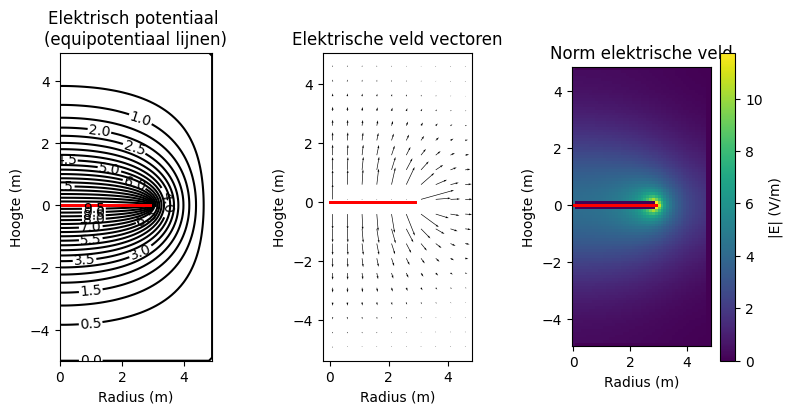

In [13]:
# Run deze cel pas deze niet aan.
V0 = 0  # electric potential at boundary of domain (V)

# Één schijf
z_pos_disk1 = 0  # z-coördinaat van de eerste geleidende schijf (m)
z_pos_disk2 = z_pos_disk1  # z-coördinaat van de tweede geleidende schijf (m)
V1 = 10  # elektrische potentiaal van de eerste geleidende schijf (V)

r, z, r_repmat, V, B, idx_R, idx_z1, idx_z2 = initialize_variables_Laplace(width_domain, disk_radius, height_domain, grid_step, z_pos_disk1, z_pos_disk2, V0, V1, V1)

"""--------------------------------------------------------------------
Veldberekening voor een geleidende schijf
"""
solve_Laplace_equation(V, B, r_repmat, grid_step, idx_z1, idx_z2, idx_R, V1, V1, 1e-3)
Er, Ez, normE = compute_E_disk(V,B,grid_step)
r_for_E = r[1:-1]  # de centered finite-difference method kan E niet berekenen op het allereerste en allerlaatste gridpunt in de r-dimensie
z_for_E = z[1:-1]  # de centered finite-difference method kan E niet berekenen op het allereerste en allerlaatste gridpunt in de z-dimensie

""""---------------------------------------------------------
Plot het berekende veld
"""
plot_results_disk(Ez, Er, normE, V, r, z, grid_step, disk_radius, z_pos_disk1, z_pos_disk2)

#### Vraag 3a: De simulatie van het elektrische veld van een geleidende schijf op constant potentiaal

1. Plot de elektrische veld sterkte op de as van de schijf.
2. Print de norm van het elektrische veld op de as heel dicht bij het midden van de schijf, zorg hier voor een nette opmaak.

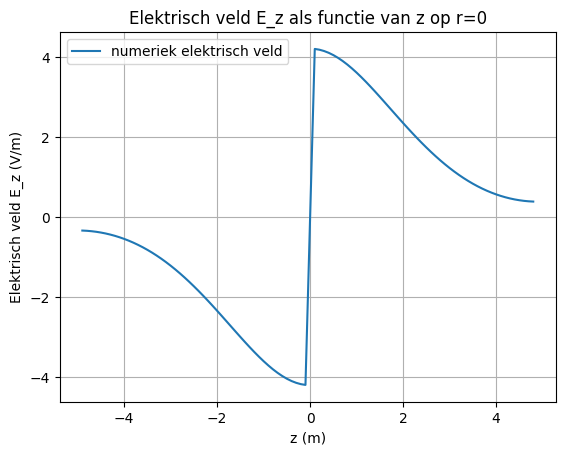

In [14]:
###
###Jouw code hier###
###


index_r_zero3a= np.argmin(np.abs(r_for_E)) # index van r = 0

E_z3a= Ez[:, index_r_zero3a] #r=0, dus we nemen alle z-waarden bij r=0

plt.figure()
plt.plot(z_for_E, E_z3a, label="numeriek elektrisch veld")
plt.xlabel("z (m)")
plt.ylabel("Elektrisch veld E_z (V/m)")
plt.title("Elektrisch veld E_z als functie van z op r=0")
plt.legend()
plt.grid(True)
plt.show()




#### Vraag 3b: De oppervlakte lading in het midden van een geleidende schijf op constant potentiaal

1. Met welke formule kan je de oppervlaktelading benaderen in het midden van de schijf($r=0$, $z=0$)?
2. Print netjes de benadering van de oppervlakte lading in het midden van de schijf.

##### Antwoord 3b

*Geef in deze markdown cel je antwoord op 3b.1.*

$$
    E =\frac{\sigma}{\epsilon_{0}}\hat{n} 
    \rightarrow
    \sigma_{midden} = \epsilon_{0}E_{midden}
    $$

In [15]:
#### Print met deze cel met een nette opmaak je antwoord op vraag 3b 2.
index_r_zero3b= np.argmin(np.abs(r))  # index van r = 0
index_z_zero3b= np.argmin(np.abs(z))  # index van z = 0

E_oorsprong_3b= normE[index_z_zero3b, index_r_zero3b] #norm van het elektrische veld op r=0 en z=0 --> het is normE(r=0, z=0) . 

sigma_oorsprong_3b= epsilon0 * E_oorsprong_3b #oppervlakte ladingsdichtheid van de schijf

print(f"De oppervlakte ladingsdichtheid van de schijf is: {sigma_oorsprong_3b} C/m²")


De oppervlakte ladingsdichtheid van de schijf is: 3.720313733538949e-11 C/m²


#### Vraag 3c: De oppervlaktelading van een geleidende schijf op constant potentiaal

De oppervlakte lading $\sigma(r)$ van een geleidende schijf met straal $R$ is niet uniform verdeeld over de schijf, maar wordt gegeven door (Problems 2.58 and 2.63 Griffiths 5th edition):
$$\sigma(r) = \frac{Q}{2 \pi R \sqrt{R^2 - r^2}}$$

1. Bereken de totale lading op de schijf met behulp van vraag 3a en 3b.
2. Vergelijk de oppervlakte lading in het centrum van de geleidende schijf met dat van een uniform geladen schijf met dezelfde totale lading.
3. Plot de oppervlakte lading van de geleidende schijf met de berekende lading $Q$, tussen $r = 0$ en $R$.
4. Plot in hetzelfde figuur de oppervlaktelading van een uniform geladen schijf met dezelfde lading $Q$.


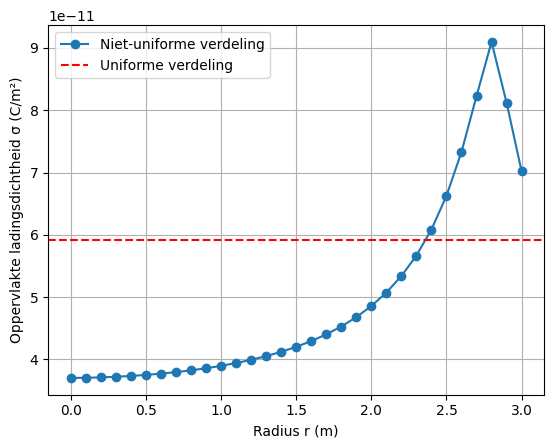

In [16]:
###
###Jouw code hier###
###
index_r_zero3c= np.argmin(np.abs(r))  # index van r = 0
r_schijf = r[index_r_zero3c : idx_R+1] # straal van de schijf, waarbij index_R_3c de index is van het gridpunt dat het dichtst bij de straal van de schijf ligt
index_z_zero3c= np.argmin(np.abs(z-0.1))
sigma_r_3c= epsilon0 * normE[index_z_zero3c, index_r_zero3c:idx_R+1] #oppervlakte ladingsdichtheid van de schijf, waarbij normE[index_z_zero3c, index_r_zero3c] de norm van het elektrische veld op r=0 en z=0 is.
Q_tot_3c= np.sum(sigma_r_3c * 2 * np.pi * r_schijf * grid_step) # totale lading op de schijf, waarbij sigma_r_3c de oppervlakte ladingsdichtheid van de schijf is, r_schijf de straal van de schijf is en (r[1] - r[0]) de breedte van het grid in de r-dimensie is.


sigma_uniform_3c = Q_tot_3c / (np.pi * disk_radius**2)

plt.figure()
plt.plot(r_schijf, sigma_r_3c, 'o-', label="Niet-uniforme verdeling")
plt.axhline(y=sigma_uniform_3c, color='red', linestyle='--', label="Uniforme verdeling")
plt.xlabel("Radius r (m)")
plt.ylabel("Oppervlakte ladingsdichtheid σ (C/m²)")
plt.legend()
plt.grid(True)
plt.show()

#### Vraag 3d: Het edge effect

1. Bepaal het maximum elektrische veld door de geleidende schijf in de simulatie.
2. Bepaal waar in de ruimte dit maximum zich bevindt.
3. Hoeveel hoger is dit maximum dan het elektrische veld in het midden van de schijf?
4. Print met een nette opmaak de waardes die je hier hebt berekend.
5. Leg uit wat de oorzaak van dit lokaal hoge elektrische veld is?


In [17]:
# Deze cel kan je gebruiken om van vraag 3c 1 tot en met 4 te beantwoorden.
#print(np.max(sigma_r_3c)/epsilon0)

E_max3d = np.max(normE)
print(f"De maximale waarde van de norm van het elektrische veld is: {E_max3d} V/m")

#2
index_max3d = np.unravel_index(np.argmax(normE), normE.shape)  # index van het maximum van normE in 2D
z_max3d = z[index_max3d[0]]
r_max3d = r[index_max3d[1]]

print (f"De maximale waarde van het elektrische veld ligt bij r={r_max3d} en z={z_max3d} m")

#3
index_z_zero3d = np.argmin(np.abs(z-0.1))  # index van z = 0
E_midden_3d = normE[index_z_zero3d, index_max3d[1]] #norm van het elektrische veld in het midden van de schijf, waarbij index_z_zero3d de index is van z=0 en index_r_zero3c de index is van r=0.

E_verschil_3d = E_max3d - E_midden_3d
print(f"Het verschil tussen het maximale elektrische veld en het elektrische veld in het midden van de schijf is: {E_verschil_3d} V/m")






De maximale waarde van de norm van het elektrische veld is: 11.752993215742134 V/m
De maximale waarde van het elektrische veld ligt bij r=2.9000000000000004 en z=-1.7763568394002505e-14 m
Het verschil tussen het maximale elektrische veld en het elektrische veld in het midden van de schijf is: 2.581052099525282 V/m


##### Antwoord 3d.5

Het verschil is oneindig groot, omdat bij r=0 is E=0 en bij r=R gaat E naar oneindig

### 4) Twee geleidende platen op potentiaal $V_1$ and $-V_1$

In de cel hieronder wordt weer op dezelfde manier als in opdracht 3 de laplace vergelijking van deze situatie opgelost.

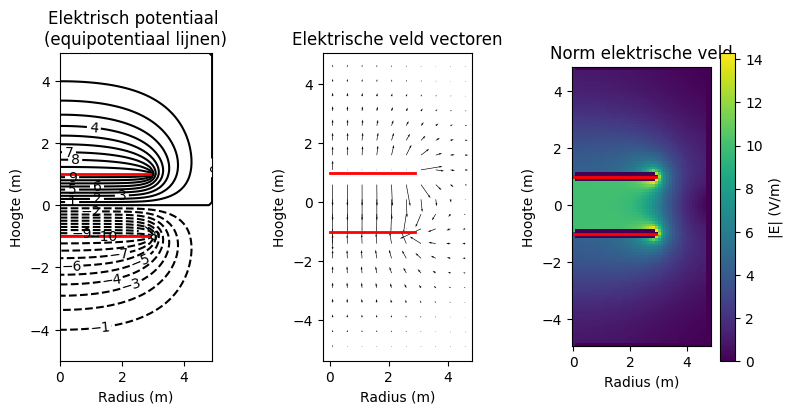

In [18]:
# Run deze cel en pas de cel aan in vraag 4f.
# Voor twee schijven
spacing_between_disks = 2  # (m)
z_pos_disk1 = spacing_between_disks/2  # z-coördinaat van de eerste geleidende schijf (m)
z_pos_disk2 = -spacing_between_disks/2  # z-coördinaat van de tweede geleidende schijf (m)
V1 = 10  # elektrische potentiaal van de eerste geleidende schijf (V)
V2 = -10  # elektrische potentiaal van de tweede geleidende schijf (V)

r, z, r_repmat, V, B, idx_R, idx_z1, idx_z2 = initialize_variables_Laplace(width_domain, disk_radius, height_domain, grid_step, z_pos_disk1, z_pos_disk2, V0, V1, V2)

"""--------------------------------------------------------------------
Veldberekening voor de twee geleidende schijven
"""
solve_Laplace_equation(V, B, r_repmat, grid_step, idx_z1, idx_z2, idx_R, V1, V2, 1e-3)
Er, Ez, normE = compute_E_disk(V, B, grid_step)
r_for_E = r[1:-1]  # de centered finite-difference method kan E niet berekenen op het allereerste en allerlaatste gridpunt in de r-dimensie
z_for_E = z[1:-1]  # de centered finite-difference method kan E niet berekenen op het allereerste en allerlaatste gridpunt in de z-dimensie

""""---------------------------------------------------------
Plot het berekende veld
"""
plot_results_disk(Ez, Er, normE, V, r, z, grid_step, disk_radius, z_pos_disk1, z_pos_disk2)


#### Vraag 4a: Het $z$-component van het numeriek berekende elektrische veld van twee geleidende platen

1. Plot het $z$-component van het numeriek berekende elektrische veld op de as van de schijven.


Minimale waarde van het elektrische veld bij r=0 is: -10.004017117671467 V/m


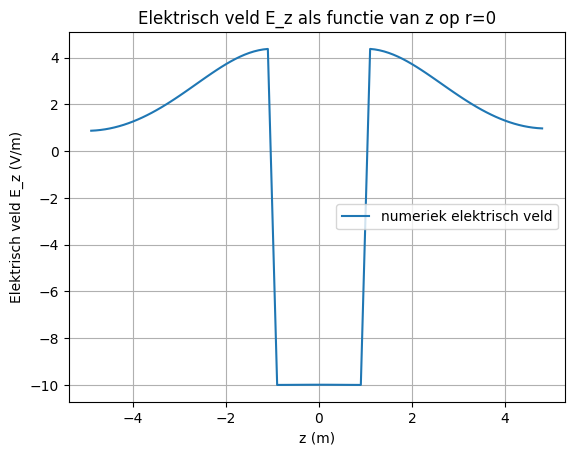

In [20]:
###
###your code here###
###

index_r_zero4a= np.argmin(np.abs(r_for_E)) # index van r = 0

Ez4a= Ez[:, index_r_zero4a] #r=0, dus we nemen alle z-waarden bij r=0

print (f"Minimale waarde van het elektrische veld bij r=0 is: {np.min(Ez4a)} V/m")



plt.figure()
plt.plot(z_for_E, Ez4a, label="numeriek elektrisch veld")
plt.xlabel("z (m)")
plt.ylabel("Elektrisch veld E_z (V/m)")
plt.title("Elektrisch veld E_z als functie van z op r=0")
plt.legend()
plt.grid(True)
plt.show()

#### Vraag 4b: Verschillen tussen verschillende configuraties

1. Gegeven het potentiaal tussen twee geleidende platen, wat is het theoretische elektrische veld in elke regio? Laat dit zien met een afleiding en een schets die de verschillende regio's aangeeft.
2. Beschrijf het numeriek berekende elektrische veld op de as van de schijven, komt dit overeen met het theoretische elektrische veld?
3. Vergelijk het numeriek berekende elektrische veld tussen de twee schijven ($r=0$ and $z=0$) met dat van een enkele geleidende schijf op hetzelfde potentiaal(vraag 3a), welk voordeel heeft deze configuratie?

##### Antwoorden 4b

*Laat in deze markdown cel je antwoorden op vraag 4b zien.*

1. afbeelding xxxx

2. In de plot van de numerieke berekende elektrische veld zie je bij z tussen -1 en 1 dat het elektrische veld -10 V/m is. hoe verder je van de as weggaat, hoe groter het elektrisch veld wordt.

Het elektrisch veld komt wel overeen met het theoretische elektische veld, omdat we berekende voor de z-component dat dit -10 V/m moest zijn. Dit is ook in het numerieke plot te zien.

3. Het elektrisch veld neemt bij de as langzamer af bij de dubbelplaat dan bij de enkelplaat. Hierdoor is er voor een groot gebied een soort "homogeen" elektrisch veld. Hier ondervindt dan een geladen deeltje overal in het gebied dezelfde kracht. 

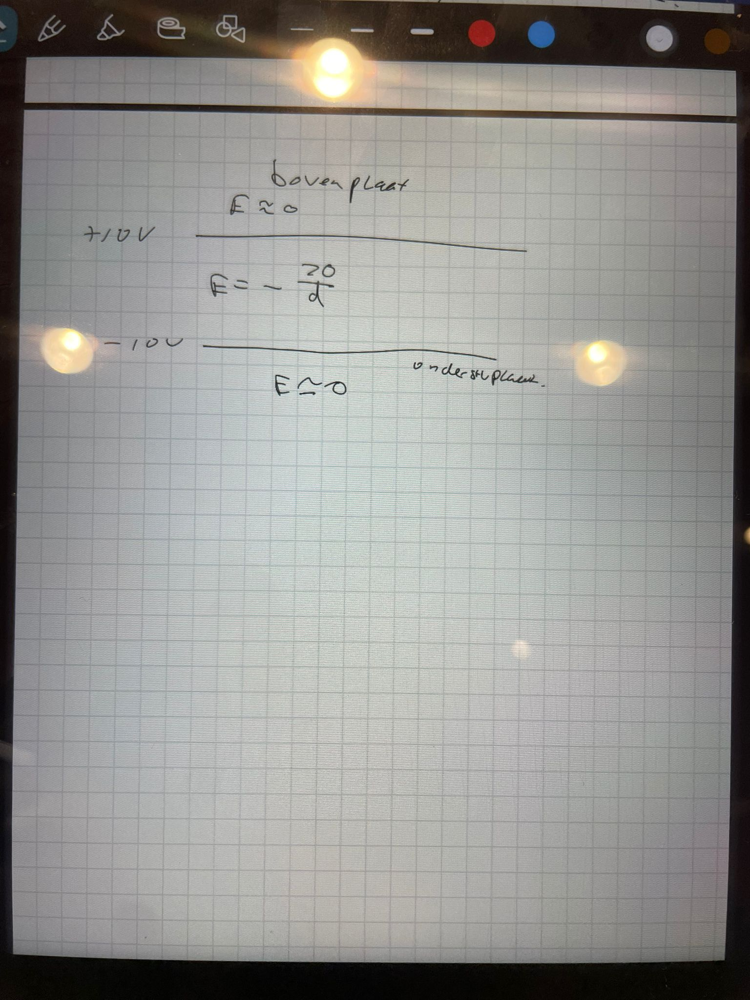

In [ ]:
img2 = Image.open("Opgave 4b.jpeg")
display(img2)

#### Vraag 4c: De capaciteit tussen twee geleidende platen

1. Bepaal de verwachte oppervlakte lading op de binnenzijde van een van de schijven.
2. Bepaal de verwachte totale lading op beide schijven.
3. Bepaal de capaciteit van deze situatie.
4. Print alle bepaalde waardes op een nette en overzichtelijke manier.

In [29]:
###
###your code here###
###

E_z4_c= 10  #we nemen de absolute waarde van E_z4a omdat we alleen geïnteresseerd zijn in de grootte van het elektrische veld.

sigma_4c= epsilon0 * E_z4_c 

A_disk_4c= np.pi * disk_radius**2

Q_tot_4c_binnenzijde= sigma_4c * A_disk_4c
Q_tot_4c_buitenzijde= -Q_tot_4c_binnenzijde

delta_V= np.abs(V1 - V2)

C_4c= Q_tot_4c_binnenzijde / delta_V


print(f"De oppervlakte ladingsdichtheid op de binnenzijde van de schijf is: {sigma_4c} C/m²")
print(f"De totale lading op de binnenzijde van de schijf is: {Q_tot_4c_binnenzijde} C")
print(f"De totale lading op de buitenzijde van de schijf is: {Q_tot_4c_buitenzijde} C")
print(f"De capaciteit van de condensator is: {C_4c} F")




De oppervlakte ladingsdichtheid op de binnenzijde van de schijf is: 8.853999999999999e-11 C/m²
De totale lading op de binnenzijde van de schijf is: 2.503409521939562e-09 C
De totale lading op de buitenzijde van de schijf is: -2.503409521939562e-09 C
De capaciteit van de condensator is: 1.251704760969781e-10 F


#### Vraag 4d: Theoretische oppervlakte lading

1. Is de oppervlaktelading aan de buitenkant van de schijven gelijk aan nul, beargumenteer waarom wel of niet.

2. Wat is het elektrische veld nabij het oppervlak van een geleider?



##### Antwoorden 4d

1. Het nadert 0, omdat we ladingen veel liever direct naar de andere plaat willen bewegen dan aan de buitenkant, maar nogsteeds zijn er een aantal ladingen die naar de buitenkant buigen, waardoor de oppervlakte lading niet gelijk is aan nul

2. Nabij het oppervlak van een geleider is het elektrische veld binnen de geleider nul en staat het veld net buiten het oppervlak loodrecht op het oppervlak met E= sigma/ epsilon_0

#### Vraag 4e: Numeriek berekende ladingsdichtheid

1. Welke waarde heeft het $z$-component van het elektrische veld, op de as van de schijf net onder de onderste schijf.
2. Wat is volgens de formule uit vraag 4d 2 de ladingsdichtheid aan de onderkant van de onderste geleidende plaat.
3. Welke waarde heeft het $z$-component van het elektrische veld, op de as van de schijf net boven de onderste schijf.
4. Wat is volgens de formule uit vraag 4d 2 de ladingsdichtheid aan de bovenkant van de onderste geleidende plaat.
5. Print de bepaalde waardes op een nette en overzichtelijke manier.

In [28]:
###
###Your code here###
index_r_zero4e = np.argmin(np.abs(r_for_E)) # index van r = 0
index_z_below4e = np.argmin(np.abs(z_for_E - (z_pos_disk2 - grid_step)))

E_below4e = Ez[index_z_below4e, index_r_zero4e]
sigma_below4e = epsilon0 * E_below4e

index_z_above4e = np.argmin(np.abs(z_for_E - (z_pos_disk2 + grid_step)))

E_above4e = Ez[index_z_above4e, index_r_zero4e]
sigma_above4e = epsilon0 * E_above4e

print(f"Elektrische veld net onder de schijf: {E_below4e} V/m")
print(f"Oppervlakte ladingsdichtheid net onder de schijf: {sigma_below4e} C/m²")

print(f"Elektrische veld net boven de schijf: {E_above4e} V/m")
print(f"Oppervlakte ladingsdichtheid net boven de schijf: {sigma_above4e} C/m²")



Elektrische veld net onder de schijf: 4.3767102504175615 V/m
Oppervlakte ladingsdichtheid net onder de schijf: 3.8751392557197085e-11 C/m²
Elektrische veld net boven de schijf: -10.004017090478857 V/m
Oppervlakte ladingsdichtheid net boven de schijf: -8.85755673190998e-11 C/m²


#### Vraag 4f: Conclusies over de ladingsdichtheid op de twee schijven

1. Wat kan je uit vraag 4d en e concluderen over de daadwerkelijke lading op een schijf in tegenstelling tot de berekende lading in vraag 4c?
2. Wat is de invloed hiervan op de capaciteit berekend in vraag 4c?
3. Run de cel net onder het kopje vraag 4 opnieuw, maar dan met een kleinere afstand tussen de schijven, wat verandert er?

##### Antwoorden 4f

1. De ladingen van beide oppervlakten zijn niet even groot. Ze hebben aan de binnenkant een grotere lading dan aan de buitenkant. Terwijl we bij 4c beide lading hetzelfde namen, maar dan tegenovergesteld

2. Volgens de formule van capaciteit is het afhankelijk van de lading van de binnenkant Q. Als deze groter wordt, dan wordt de capaciteit ook groter.

3. Het elektrisch veld tussen de 2 platen wordt groter en daarnaast wordt de norm van het elektrisch veld hierdoor ook groter.

Daarnaast als E toeneemt, dan neemt sigma ook toe, waardoor de totale lading Q ook toeneemt. Daarnaast is Capaciteit omgekeerd evenredig met de afstand tussen de schijven, dus deze neemt ook toe

### 5) Voorbereidende opdracht voor de fysieke DEF ontwerpopdracht

In deze vraag zullen we ingaan op benodigde voorkennis voor de fysieke ontwerpopdracht "Maak een sensor met condensatoren". De formules die je in deze opdracht opstelt, heb je nodig gedurende de fysieke ontwerpopdracht.

In deze vraag zullen we kijken naar de ideale vlakke plaat condensator. Als de afstand tussen de platen veel kleiner is dan de grootte van de platen dan wordt de aanname gemaakt dat het veld tussen de platen constant is. Deze aanname zal niet helemaal overeenkomen met de werkelijkheid, zoals je in deze opdracht en de fysieke DEF ontwerpopdracht achter zal komen.

#### Vraag 5a: Functies voor de capaciteit van enkele opdrachten

1. Vind de formule voor de capaciteit van een vlakke plaat condensator en een cilinder condensator, onder de aanname dat de afstand tussen de platen veel kleiner is dan het oppervlakte van de condensator (vlakke plaat aanname).
2. Schrijf een python functie die de relevante parameters als input neemt en de capaciteit van een vlakke plaat condensator als output heeft.
3. Vind de formule voor de capaciteit van een cilinder condensator onder de aanname dat de afstand tussen de binnen en buiten wand klein is.
4. Schrijf een python functie die de relevante parameters als input neemt en de capaciteit van een cilinder condensator als output heeft.

In [21]:
def vlakkeplaat(epsilon,A_vlakkeplaat, d_vlakkeplaat):
    C = epsilon * A_vlakkeplaat / d_vlakkeplaat
    return C

def cilinder(epsilon,lengte_cilinder, binnenstraal_buiten_cilinder, straal_binnen_cilinder):
    C = 2* np.pi * epsilon * lengte_cilinder / np.log(binnenstraal_buiten_cilinder/ straal_binnen_cilinder)
    return  C 

#### Vraag 5b: Capaciteit van enkele simpele condensatoren

Gebruik in deze opdracht de functie die je bij vraag 5.1 geschreven hebt.
Hieronder staan een aantal condensatoren waarvoor jullie de capaciteit gaan berekenen. Print de capaciteit van elke condensator op een nette en overzichtelijke manier.
1. Bereken de capaciteit van een condensator gemaakt van twee vierkante plaatjes van 10 bij 10 cm met een plaatafstand van 1 mm en lucht als medium?
2. Bereken de capaciteit van een cilinder condensator met een binnendiameter van 9 mm en een buitendiameter van 10 mm met een lengte van 10 cm en lucht als medium?
3. Bereken de capaciteit van de condensatoren als de afstand tussen de platen verdubbeld
4. Bereken de capaciteit van de condensatoren uit 1 en 2 hierboven beschreven als ze gevuld zijn met water.
5. Bereken de capaciteit van de condensatoren uit 1 en 2 hierboven als de holte gevuld is met PVC.


In [23]:
###
###your code here###
###

#1

A_1= 0.1 * 0.1 # oppervlakte van de vlakke plaat (m²)
d_1= 0.001 # afstand tussen de platen (m)

epsilon_lucht= 1.0006 * epsilon0 # permittiviteit van lucht (F/m)


C_1_vierkanteplaat= vlakkeplaat(epsilon_lucht,A_1, d_1)

print(f"De capaciteit van de vlakke plaat condensator is: {C_1_vierkanteplaat} F")

#2

lengte_cilinder_2= 0.1 # lengte van de cilinder (m)
straal_binnen_cilinder_2= 0.0045 # binnenstraal van de cilinder (m)
binnenstraal_buiten_cilinder_2= 0.005 # binnenstraal van de buitenste cilinder (m)

C_2_cilinder= cilinder(epsilon_lucht,lengte_cilinder_2, binnenstraal_buiten_cilinder_2, straal_binnen_cilinder_2)

print(f"De capaciteit van de cilinder condensator is: {C_2_cilinder} F")


#3

d_3= 2*d_1
C_3_vierkanteplaat= vlakkeplaat(epsilon_lucht,A_1, d_3)

print(f"De capaciteit van de vlakke plaat condensator met dubbele afstand is: {C_3_vierkanteplaat} F")

d_3_cilinder= 2*(binnenstraal_buiten_cilinder_2 - straal_binnen_cilinder_2)

binnenstraal_buitencilinder_3= straal_binnen_cilinder_2 + d_3_cilinder

C_3_cilinder= cilinder(epsilon_lucht,lengte_cilinder_2, binnenstraal_buitencilinder_3, straal_binnen_cilinder_2)

print(f"De capaciteit van de cilinder condensator met dubbele afstand is: {C_3_cilinder} F")

#4

epsilon_water= 80 * epsilon0 # permittiviteit van water (F/m)
C_4_vierkanteplaat= vlakkeplaat(epsilon_water, A_1, d_1)

C_4_cilinder= cilinder(epsilon_water, lengte_cilinder_2, binnenstraal_buiten_cilinder_2, straal_binnen_cilinder_2)

print(f"De capaciteit van de vlakke plaat condensator met water als diëlektricum is: {C_4_vierkanteplaat} F")
print(f"De capaciteit van de cilinder condensator met water als diëlektricum is: {C_4_cilinder} F")

#5

epsilon_PVC = 3 * epsilon0 # permittiviteit van PVC (F/m)
C_5_vierkanteplaat = vlakkeplaat(epsilon_PVC, A_1, d_1)
C_5_cilinder = cilinder(epsilon_PVC, lengte_cilinder_2, binnenstraal_buiten_cilinder_2, straal_binnen_cilinder_2)

print(f"De capaciteit van de vlakke plaat condensator met PVC als diëlektricum is: {C_5_vierkanteplaat} F")
print(f"De capaciteit van de cilinder condensator met PVC als diëlektricum is: {C_5_cilinder} F")








De capaciteit van de vlakke plaat condensator is: 8.8593124e-11 F
De capaciteit van de cilinder condensator is: 5.283260162105997e-11 F
De capaciteit van de vlakke plaat condensator met dubbele afstand is: 4.4296562e-11 F
De capaciteit van de cilinder condensator met dubbele afstand is: 2.7739327546155265e-11 F
De capaciteit van de vlakke plaat condensator met water als diëlektricum is: 7.0832000000000005e-09 F
De capaciteit van de cilinder condensator met water als diëlektricum is: 4.224073685473514e-09 F
De capaciteit van de vlakke plaat condensator met PVC als diëlektricum is: 2.6562e-10 F
De capaciteit van de cilinder condensator met PVC als diëlektricum is: 1.5840276320525677e-10 F


#### Vraag 5c: Condensatoren uit het dagelijkse leven

Gebruik in deze opdracht de functie die je bij vraag 5.1 geschreven hebt.
Hieronder is een foto te zien van condensatoren die in het dagelijkse leven gebruikt wordt.
Print de capaciteiten in deze vraag op een nette en overzichtelijke manier.
1. In figuur 5.1 is een condensator te zien van 1 $\micro$F, stel deze condensator kan geapproximeerd worden als een cilinder condensator met binnendiameter 5 mm en een buitendiameter van 6 mm. Bereken wat de lengte van de condensator dan zou zijn.
Stel dat we een vierkante plaat condensator hebben van 1 $\micro$F.
2. Bereken hoe lang de vlakke plaat condensator moet zijn als er 0.5 mm tussen de platen zit en de platen 6 mm breed zijn.

![figure 5.1](figures/Condensator_1_uF.jpg)

##### Figure: 5.1 Een 1 microfarad condensator.

In [24]:
###
###Jouw code hier###
#1
C_5c = 1e-6
straal_binnen_cilinder_5c = 0.0025
binnenstraal_buiten_cilinder_5c = 0.003
L_5c = C_5c * np.log(binnenstraal_buiten_cilinder_5c / straal_binnen_cilinder_5c) / (2 * np.pi * epsilon0)
print(f"De lengte van de cilinder condensator is: {L_5c} m")

###2

C_5c_2 = 1e-6
breedte_vlakkeplaat_5c = 0.006 #m
d_5c= 0.0005 #m

A_5c= C_5c_2 * d_5c / epsilon0
lengte_vlakkeplaat_5c = A_5c / breedte_vlakkeplaat_5c
print(f"De lengte van de vlakke plaat condensator is: {lengte_vlakkeplaat_5c} m")






De lengte van de cilinder condensator is: 3277.3183867142097 m
De lengte van de vlakke plaat condensator is: 9411.941871847 m


#### Vraag 5d: Hoge capaciteit condensatoren

1. Beargumenteer of je antwoorden uit vraag 5c realistisch zijn.
2. Bekijk je formule uit vraag 5a en bedenk hoe ze dit binnen in de condensator opgelost hebben.


##### Antwoorden 5d

1. Ze zijn niet realistich, want als je naar de condensator zelf kijkt op de afbeelding kan je het niet voorstellen dat de lengte van de condensator 3 of 9 km lang is. Hoewel het niet realistisch lijkt, is het wel de realiteit 

2. ze gebruiken materialen met hogere permitiviteit en gebruiken meerdere platen, die dicht bij elkaar gestapeld zijn zodat A groter wordt en d zo klein mogelijk wordt.

#### Vraag 5e: Condensator in een achtbaan

Gebruik in deze opdracht de functie die je bij vraag 5.1 geschreven hebt.

Met het vak inleidend practicum zijn jullie naar Drievliet gegaan om daar metingen aan de attracties te doen. In Drievliet staat de achtbaan Formule X, deze achtbaan heeft een topsnelheid van 70 $\frac{\text{km}}{\text{h}}$ en bevat een treintje met plek voor 6 mensen. Deze snelheid bereikt de achtbaan door heel snel een karretje weg te schieten, dit wordt gedaan door de treintjes met een lineaire inductie motor te versnellen. Om de impact hiervan op het stroomnet te beperken gebruiken zij een condensator om de energie op te slaan en dan in een keer af te staan aan het treintje. In deze opdracht gaan we kijken wat de afmetingen zouden moeten zijn als ze vlakke plaat condensatoren zouden gebruiken.

De energie die opgeslagen is in een condensator kan berekend worden met de onderstaande formule.

$E = \frac{1}{2} CV^2$
Hierin is $E$ de totaal opgeslagen energie $C$ de capaciteit en $V$ het voltage waarop de condensator opereert, in dit geval $10$ $kV$.
1. Schat de massa van een treintje dat afgeschoten wordt.
2. Bereken de totale energie van het treintje na het afschieten.
3. Bereken de totale capaciteit van de condensator.
4. Bereken het oppervlakte van een vlakke plaat condensator die deze capaciteit heeft als die gevuld is met water en de platen 1 mm van elkaar afstaan.
5. Print alle berekende waardes op een nette en overzichtelijke manier.
6. Is dit realistisch, bedenk een manier hoe dit toch kan in een relatief klein volume.


In [27]:
###
###Jouw code hier###
###
v_5e= 70/3.6 #m/s

#1

m_karretje= 4000 #kg

#2 
E_5e= 0.5 * m_karretje * v_5e**2

#3
V_5e= 10000 #V

C_5e= 2* E_5e / (V_5e**2)

#4
d_5e= 0.001 #m
A_5e= C_5e * d_5e / epsilon_water

#5
print(f"De Totale energie: {E_5e} J")
print(f"De benodigde capaciteit van de condensator: {C_5e} F")
print(f"De benodigde oppervlakte van de condensator: {A_5e} m²")





De Totale energie: 756172.8395061728 J
De benodigde capaciteit van de condensator: 0.015123456790123457 F
De benodigde oppervlakte van de condensator: 21351.16443150477 m²


##### Antwoorden 5e

Het is niet realistisch, maar dit zou kunnen in een relatief kleine volume als je alle platen heel dicht op elkaar plaats met 1 mm afstand bijv en als de dikte van de plaat niet zo groot zijn

#### Vraag 5f: Veranderende capaciteit

Gebruik in deze opdracht de functie die je bij vraag 5.1 geschreven hebt.

1. Bereken en plot de capaciteit van een vlakke plaat condensator van $10$ bij $10$ $cm$ waarbij de afstand tussen de platen lineair toeneemt van $0.5$ $mm$ tot $5$ $mm$.
2. Bereken en plot de capaciteit van een cilinder condensator met een binnendiameter van 9 mm en een buitendiameter van 10 mm en 10 cm lang, waarbij de binnencilinder er langzaam in 10 seconde uitgetrokken wordt.

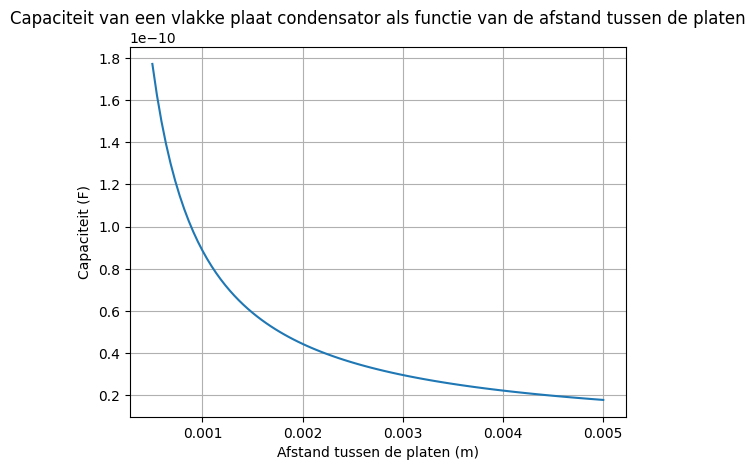

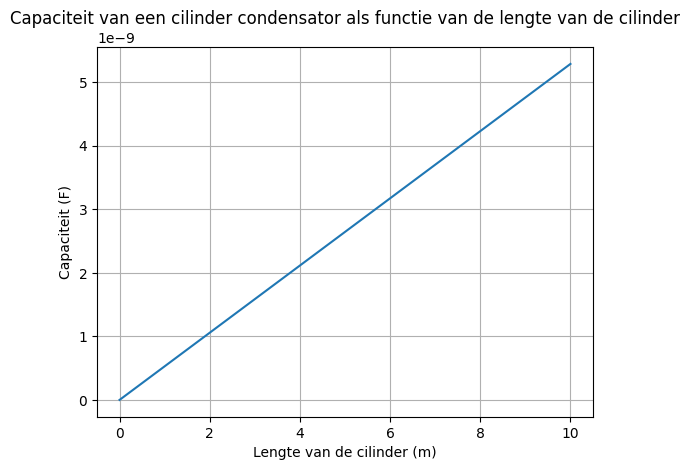

In [25]:
###
###Jouw code hier###
A_5f = 0.1 * 0.1 #m²
d_vlakkeplaat_5f = np.linspace(0.0005,0.005,100)
C_vlakkeplaat_5f = vlakkeplaat(epsilon_lucht, A_5f, d_vlakkeplaat_5f)

plt.figure()
plt.plot(d_vlakkeplaat_5f, C_vlakkeplaat_5f)
plt.xlabel("Afstand tussen de platen (m)")
plt.ylabel("Capaciteit (F)")
plt.title("Capaciteit van een vlakke plaat condensator als functie van de afstand tussen de platen")
plt.grid(True)
plt.show()

lengte_cilinder_5c = np.linspace(10,0,100)
r_binnen_cilinder_5c = 0.0045
binnen_r_buiten_cilinder_5c = 0.005
C_cilinder_5f = cilinder(epsilon_lucht, lengte_cilinder_5c, binnen_r_buiten_cilinder_5c, r_binnen_cilinder_5c)

plt.figure()
plt.plot(lengte_cilinder_5c, C_cilinder_5f)
plt.xlabel("Lengte van de cilinder (m)")
plt.ylabel("Capaciteit (F)")
plt.title("Capaciteit van een cilinder condensator als functie van de lengte van de cilinder")
plt.grid(True)  
plt.show()
###



## Stop hier met werken tot na de fysieke ontwerpopdracht in week 3.

### 6) Reflectie opdracht voor na de fysieke ontwerpopdracht


Als het goed is, heeft ieder teamlid van deze simulatie-opdracht een andere opstelling ontworpen hebben tijdens de fysieke ontwerpopdracht. Kies in goed overleg voor deze opdracht een van jullie twee ontwerpen.

Voeg hieronder eerst een foto in van je opstelling die je gekozen hebt.

Jullie gaan in deze opdracht het verschil tussen jullie voorspelde verband en jullie uiteindelijke verkregen kalibratie grafiek proberen te verklaren. Er zijn hiervoor drie mogelijke paden die jullie kunnen kiezen om te onderzoeken, Kies deel a, b of c en werk die volledig uit voor jullie ontwerp. Let op je hoeft er maar een uit te werken.

Verander de tekst hieronder zodat deze naar jouw foto verwijst. Zorg dat de foto in de map figures staat!
![figure 5.1](image.png)

#### Vraag 6a: Dunne laag niet meegerekende diëlektricum
Deze vraag is goed om te kiezen als je in je ontwerp een kleine laag extra materiaal hebt en deze tijdens de ontwerpopdracht niet hebben meegenomen in je theoretisch kalibratie grafiek.

1. Maak een nieuwe schets van je opstelling waarbij je de dikte van het extra diëlektricum meeneemt.
2. Leid de analytische oplossing af van de capaciteit van de hierboven getekende situatie.
3. Programmeer de analytische oplossing in python.
4. Maak hierna een plot van het kalibratiegrafiek, oude en nieuwe analytische oplossing in een grafiek.
5. Beschrijf en verklaar de verschillen tussen de grafieken.


##### Antwoorden 6a

*Laat in deze cel je analytische oplossing met schets zien, dit mag met foto's of via LATEX.*

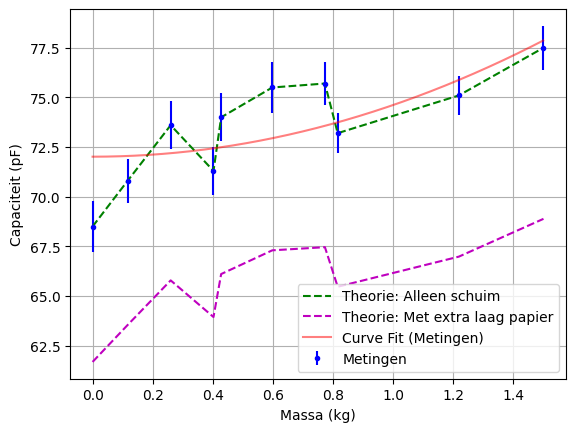

In [26]:
# Schrijf hier de code voor je oplossing. Gebruik hier je eerder gemaakte functies
# def condensator_extra_laag(#jouw variabelen): # Schrijf hier jouw functie


#Oud

epsilon_schuim= 1.065
epsilon_papier= 3.5

def vlakkeplaat(epsilon_r, A, d):
    C_farad= epsilon0 * epsilon_r * A / d
    return C_farad * 1e12 #omzetten naar pF

#nieuw

def condensator_extra_laag(A, d_schuim, d_papier):  
    C_farad = epsilon0 * A / ( (d_schuim/epsilon_schuim) + (d_papier/epsilon_papier) )
    return C_farad * 1e12 #omzetten naar pF

#kalibratiegrafiek
gewicht = np.array([1500.9, 0, 402.5, 815.9, 1219.15, 260.0, 116.6, 598.2, 773.4, 428]) * 0.001
capaciteit = np.array([77.5, 68.5, 71.3, 73.2, 75.1, 73.6, 70.8, 75.5, 75.7, 74])
u_capaciteit = np.array([1.1, 1.3, 1.2, 1.0, 1.0, 1.2, 1.1, 1.3, 1.1, 1.2])


sort_index = np.argsort(gewicht)
g_sort = gewicht[sort_index]
c_sort = capaciteit[sort_index]

d_sort = (epsilon0 * epsilon_schuim * 0.01) / (c_sort * 1e-12)

def verband(x, a, b):
    return a * x**2 + b

popt, pcov = curve_fit(verband, gewicht, capaciteit)
x_test = np.linspace(0.0, 1.5, 1000)

plt.figure()
plt.errorbar(gewicht, capaciteit, yerr=u_capaciteit, fmt='b.', label='Metingen')
plt.plot(g_sort, vlakkeplaat(epsilon_schuim, 0.01, d_sort), 'g--', label='Theorie: Alleen schuim')
plt.plot(g_sort, condensator_extra_laag(0.01, d_sort, 0.0005), 'm--', label='Theorie: Met extra laag papier')

plt.plot(x_test, verband(x_test, *popt), 'r-', label='Curve Fit (Metingen)', alpha=0.5)

plt.xlabel('Massa (kg)')
plt.ylabel('Capaciteit (pF)')
plt.grid(True)
plt.legend()
plt.show()









##### Antwoorden 6a

Beide grafieken hebben dezelfde vorm, maar de paarse grafiek heeft alleen een lagere waarde aangenomen. Dit wordt veroorzaakt, omdat bij de paarse lijn de dikte wordt vergroot door het papier. Hierdoor wordt de afstand groter. Daarnaast zorgt het papier voor een extra laag isolator, waardoor de waarde van de capaciteit inderdaad ook lager hoort te liggen

#### Vraag 6b1: Lading op een condensator met het edge effect meegenomen

In deze opdracht gaan we verder in op het Edge effect en de invloed daarvan op de praktische capaciteit. Deze opdracht bouwt voort op de vraag 4.3.
Jullie hebben tijdens de ontwerpopdracht vierkante platen gebruikt in tegenstelling tot de ronde platen waarvoor de factoren in figure[label] zijn afgeleid. Er is onderzoek gedaan naar de factoren waarmee de praktische capaciteit vergeleken met de daadwerkelijke capaciteit verschilt dat onderzoek vind je hier: https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=311759. Zoek in het onderzoek tabel 1 en formules 22 en 36 op.

1. Vergelijk de factor waarmee de schijf(disk) condensator verschilt met die van de vierkante plaat, kunnen we de vierkante plaat factor benaderen met de factor voor een disk condensator? Vergelijk het procentuele verschil tussen de factoren van de circulaire en vierkante platen, met de onzekerheden die in de meting zitten.



##### Antwoord 6b1

*Vergelijk hier de factoren tussen de circulaire en vierkante vlakke plaat condensatoren.*

#### Vraag 6b2: Capaciteit van een condensator met het edge effect meegenomen

Vanaf hier nemen we aan dat factor van de circulaire platen ongeveer gelijk is aan de factor voor vierkante platen. De factor die de capaciteit van de vlakke plaat approximatie linkt aan de werkelijke capaciteit noemen we vanaf nu de idealiteitsfactor.

1. Bereken de daadwerkelijke theoretische capaciteit van de condensator uit de sanity check 3 van de fysieke ontwerpopdracht en print deze op een nette manier.
2. Vergelijk dit met de daadwerkelijke theoretische capaciteit met de capaciteit die je op de dag zelf hebt gemeten.

Vanaf hier gaan we verder met jullie sensor van de ontwerpopdracht "Maak een sensor met condensatoren":

3. Reken je theoretische kalibratie grafiek om met de idealiteitsfactor.
4. Vergelijk je nieuwe theoretische kalibratiegrafiek van je praktische kalibratiegrafiek van de dag zelf.

In [ ]:
# Schrijf hier jouw code die de vlakke plaat capaciteit omschrijft naar de werkelijke capaciteit

# def C_niet_ideaal(#relevante parameters):
    # Jouw berekeningen


##### Antwoorden 6b2

*Doe in deze markdown cel je vergelijkingen voor de sanity check condensator en je kalibratiegrafiek.*

#### Vraag 6c: Niet linear diëlektricum optie 1

Niet alle materialen zijn een lineair diëlektricum. Een aantal van de materialen die sterk niet lineair gedrag vertonen zijn: sponzen, foam & rubber. Als je in je opdracht een materiaal gebruikt heb waarvan je verwacht dat het verband sterk niet lineair is kan dit een hele goede opdracht zijn.
| Materiaal |$\chi_2$   |
| :-------------|:-------------|
| Spons|  |

Als jouw materiaal hier niet tussen staat dan kan je zelf op zoek naar een waarde van $\chi_2$ in de literatuur.

#### Vraag 6c1

1. Leidt het D veld van de condensator af uit de wet van Gauss.
2. Vindt een analytische uitdrukking voor het elektrisch veld in termen van het D veld.

##### Antwoorden 6c 1

*Antwoord vraag 6c 1.*

#### Vraag 6c2

1. Programmeer je oplossingen voor het D en E veld in python, gebruik het D veld uit je fysieke ontwerpopdracht.

Als je het elektrische veld van een vierkante vlakke plaat condensator weet kan je de capaciteit berekenen met de onderstaande formule:
$C = \frac{A
E_z \epsilon_0}{\Delta V}$

2. Plot de capaciteit van het niet lineaire diëlektricum, het theoretische kalibratiegrafiek en de uiteindelijke kalibratiegrafiek van de fysieke ontwerpopdracht.
3. Verklaar verschillen tussen de grafieken.

In [ ]:
 # Pas deze code aan zodat jouw opstelling doorgerekend wordt
def E_condensator(x1, x2, D):
    return None

#### Vraag 7

Hoeveel van de afwijking tussen je metingen en je oorspronkelijke voorspelde kalibratiegrafiek wordt verklaard door wat je bij vraag 6 hebt uitgerekend? Kan je een (aantal) elektrisch veld en capaciteit gerelateerde reden(en) verzinnen wat de rest van de afwijking tussen meting en voorspelde kalibratiegrafiek kan verklaren.

##### Antwoorden 7

*Antwoord vraag 7, de laatste.*

Het deel dat we bij vraag 6 hebben uitgerekend laat zien waarom er verschuivingen zijn. Door de toename van de totale afstand tussen de platen neemt de totale capaciteit ook af.

Maar dit verklaart niet de vorm van de lijn.

De vorm van de lijn kan (mogelijk) verklaard worden, doordat we continu van de ideale situatie uit. We gaan ervan uit dat er een homogeen elektrisch veld is tussen de platen, maar dit is in realiteit niet het geval. Eigenlijk bolt het E-veld om de randen van de platen naar buiten. Dit zorgt voor een andere capaciteit waarde. 

Daarnaast bevat de draden die we gebruiken ook een kleine capaciteit waarde, die bijdrage levert aan de totale capaciteit waarde.

Bovendien zijn de schuim en papier ( en ook lucht hierdoor) niet 100 procent vlak. er zitten kleine luchtlaagjes ertussen die wellicht inlvoed kunnen hebben op de waarde

Ook is de "zakking" van de schuim willekeurig is bij verschillende druk. Dit zorgt ook voor een afwijking in de metingen

